In [28]:
import os
import tensorflow as tf
from PIL import Image
import numpy as np
from sklearn.model_selection import train_test_split
from keras import layers, models
import matplotlib.pyplot as plt
import itertools

In [7]:
def load_image(image_path):
    try:
        img = Image.open(image_path).convert('RGB')  # Convertir todas las imágenes a modo RGB
        img = img.resize((256, 256))  # Redimensionar las imágenes a 256x256 píxeles
        img = np.array(img)
        return img
    except Exception as e:
        print(f"Error loading image {image_path}: {e}")
        return None

def load_dataset(data_dir):
    images = []
    labels = []
    label_names = sorted(os.listdir(data_dir))
    label_map = {label_name: idx for idx, label_name in enumerate(label_names)}
    
    for label_name in label_names:
        label_dir = os.path.join(data_dir, label_name)
        if os.path.isdir(label_dir):
            for file_name in os.listdir(label_dir):
                if file_name.endswith(('.jpg', '.jpeg', '.png')):
                    image_path = os.path.join(label_dir, file_name)
                    img = load_image(image_path)
                    if img is not None:
                        images.append(img)
                        labels.append(label_map[label_name])
                    
    images = np.array(images)
    labels = np.array(labels)
    return images, labels, label_map

In [8]:
data_dir = '101_ObjectCategories'
images, labels, label_map = load_dataset(data_dir)

In [9]:
train_images, test_images, train_labels, test_labels = train_test_split(images, labels, train_size=0.8, stratify=labels)

In [10]:
train_dataset = tf.data.Dataset.from_tensor_slices((train_images, train_labels))
test_dataset = tf.data.Dataset.from_tensor_slices((test_images, test_labels))

In [11]:
dataset_info = {
    'description': 'Caltech101 dataset manually loaded',
    'features': {
        'image': {'shape': (256, 256, 3), 'dtype': 'uint8'},
        'label': {'num_classes': len(label_map), 'names': list(label_map.keys())}
    },
    'num_examples': len(images),
    'splits': {
        'train': {'num_examples': len(train_images)},
        'test': {'num_examples': len(test_images)}
    }
}

In [12]:
# Resultado final
(train_dataset, test_dataset), dataset_info = (train_dataset, test_dataset), dataset_info

In [16]:
dataset_info

{'description': 'Caltech101 dataset manually loaded',
 'features': {'image': {'shape': (256, 256, 3), 'dtype': 'uint8'},
  'label': {'num_classes': 103,
   'names': ['.DS_Store',
    'BACKGROUND_Google',
    'Faces',
    'Faces_easy',
    'Leopards',
    'Motorbikes',
    'accordion',
    'airplanes',
    'anchor',
    'ant',
    'barrel',
    'bass',
    'beaver',
    'binocular',
    'bonsai',
    'brain',
    'brontosaurus',
    'buddha',
    'butterfly',
    'camera',
    'cannon',
    'car_side',
    'ceiling_fan',
    'cellphone',
    'chair',
    'chandelier',
    'cougar_body',
    'cougar_face',
    'crab',
    'crayfish',
    'crocodile',
    'crocodile_head',
    'cup',
    'dalmatian',
    'dollar_bill',
    'dolphin',
    'dragonfly',
    'electric_guitar',
    'elephant',
    'emu',
    'euphonium',
    'ewer',
    'ferry',
    'flamingo',
    'flamingo_head',
    'garfield',
    'gerenuk',
    'gramophone',
    'grand_piano',
    'hawksbill',
    'headphone',
    'hedgeh

In [18]:
num_classes = dataset_info['features']['label']['num_classes']


In [19]:
def preprocess_image(image, label):
    image = tf.image.resize(image, (224, 224))
    image = tf.cast(image, tf.float32) / 255.0
    return image, label

train_dataset = train_dataset.map(preprocess_image).shuffle(1000).batch(32)
test_dataset = test_dataset.map(preprocess_image).batch(32)

In [20]:
model = models.Sequential([
    layers.Conv2D(32, (3, 3), activation='relu', input_shape=(224, 224, 3)),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Flatten(),
    layers.Dense(128, activation='relu'),
    layers.Dense(num_classes, activation='softmax')
])

In [21]:
model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

model.fit(train_dataset, epochs=10, validation_data=test_dataset)

Epoch 1/10
229/229 [==============================] - 244s 1s/step - loss: 3.7135 - accuracy: 0.2708 - val_loss: 2.9964 - val_accuracy: 0.3647
Epoch 2/10
229/229 [==============================] - 249s 1s/step - loss: 2.2750 - accuracy: 0.4845 - val_loss: 2.6247 - val_accuracy: 0.4478
Epoch 3/10
229/229 [==============================] - 2134s 9s/step - loss: 1.1333 - accuracy: 0.7204 - val_loss: 2.8595 - val_accuracy: 0.4680
Epoch 4/10
229/229 [==============================] - 1432s 6s/step - loss: 0.3871 - accuracy: 0.9043 - val_loss: 3.6976 - val_accuracy: 0.4560
Epoch 5/10
229/229 [==============================] - 308s 1s/step - loss: 0.1595 - accuracy: 0.9610 - val_loss: 4.1575 - val_accuracy: 0.4543
Epoch 6/10
229/229 [==============================] - 305s 1s/step - loss: 0.0812 - accuracy: 0.9828 - val_loss: 4.5258 - val_accuracy: 0.4440
Epoch 7/10
229/229 [==============================] - 304s 1s/step - loss: 0.0976 - accuracy: 0.9777 - val_loss: 4.9013 - val_accuracy: 0.45

In [22]:
num_params = model.count_params()
print(f"Number of trainable parameters in the model: {num_params}")

Number of trainable parameters in the model: 23920679


In [23]:
loss, accuracy = model.evaluate(test_dataset)
print(f"Accuracy on the test set: {accuracy * 100:.2f}%")

58/58 [==============================] - 15s 249ms/step - loss: 5.6600 - accuracy: 0.4456
Accuracy on the test set: 44.56%


1/1 [==============================] - 0s 98ms/step


ValueError: num must be an integer with 1 <= num <= 25, not 26

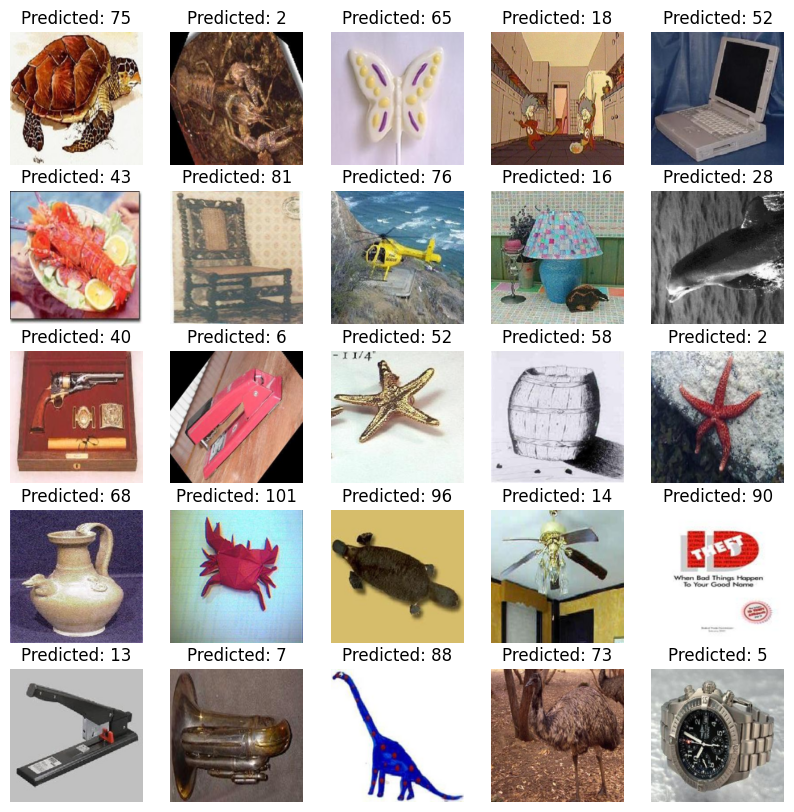

In [25]:
misclassified_images = []
misclassified_labels = []
for image, label in test_dataset:
    predictions = model.predict(image)
    predicted_label = np.argmax(predictions, axis=1)
    misclassified_idx = np.where(predicted_label != label.numpy())[0]
    for idx in misclassified_idx:
        misclassified_images.append(image[idx])
        misclassified_labels.append(predicted_label[idx])

plt.figure(figsize=(10, 10))
for i in range(len(misclassified_images)):
    plt.subplot(5, 5, i+1)
    plt.imshow(misclassified_images[i])
    plt.title(f"Predicted: {misclassified_labels[i]}")
    plt.axis('off')
plt.show()

1/1 [==============================] - 0s 47ms/step


ValueError: num must be an integer with 1 <= num <= 400, not 401

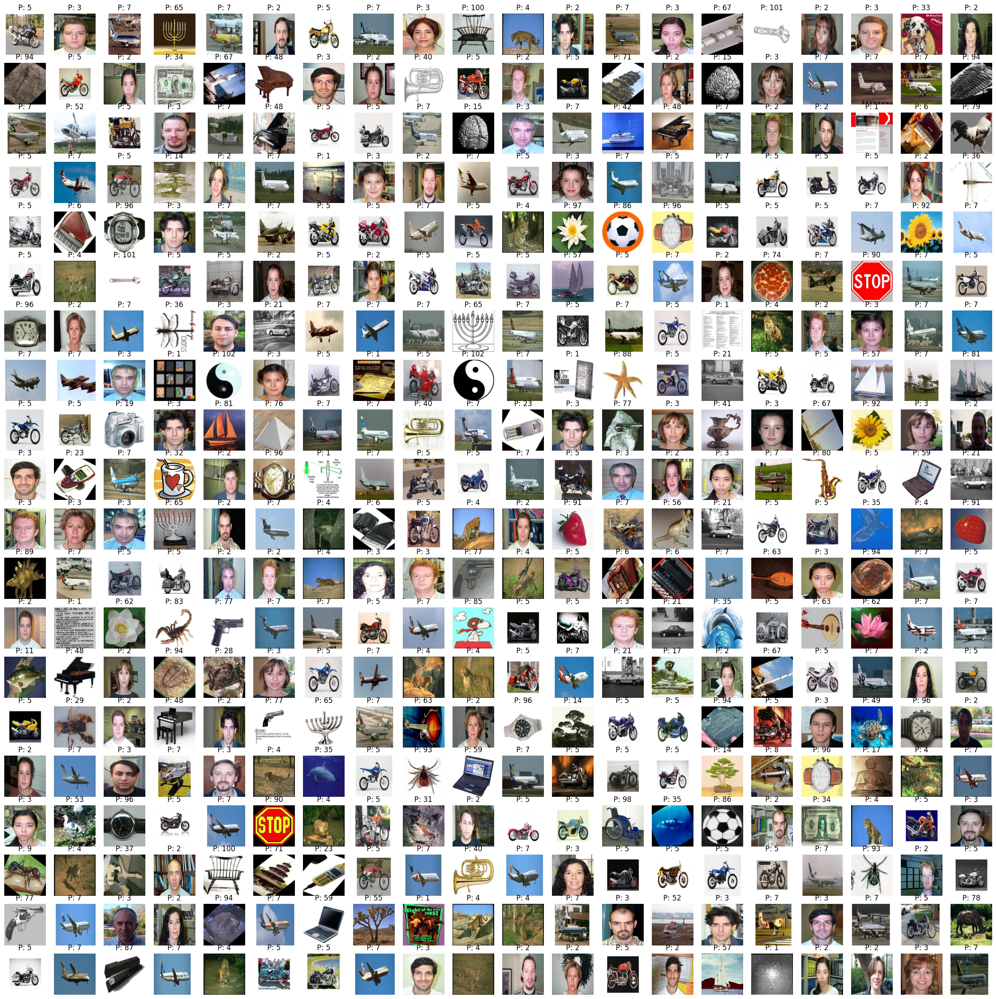

In [26]:
niceclassified_images = []
niceclassified_labels = []
for image, label in test_dataset:
    predictions = model.predict(image)
    predicted_label = np.argmax(predictions, axis=1)
    niceclassified_idx = np.where(predicted_label == label.numpy())[0]
    for idx in niceclassified_idx:
        niceclassified_images.append(image[idx])
        niceclassified_labels.append(predicted_label[idx])

plt.figure(figsize=(30, 30))
for i in range(len(niceclassified_images)):
    plt.subplot(20, 20, i+1)
    plt.imshow(niceclassified_images[i])
    plt.title(f"P: {niceclassified_labels[i]}")
    plt.axis('off')
plt.show()

1/1 [==============================] - 0s 99ms/step


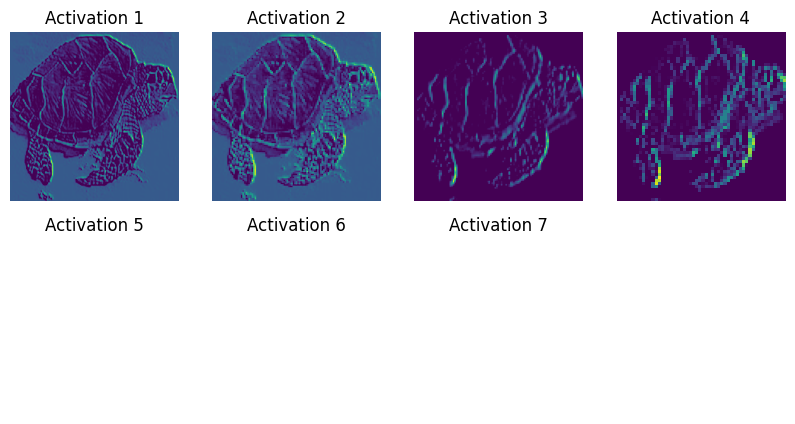

In [29]:
sample_image, _ = next(itertools.islice(iter(test_dataset), 0, 1))
sample_image = sample_image[:1]

activation_model = models.Model(inputs=model.input,
                                outputs=[layer.output for layer in model.layers])
# activation_model = models.Model(inputs=model.input, outputs=model.layers[4].output)
activations = activation_model.predict(sample_image)

plt.figure(figsize=(10, 5))
for i, activation in enumerate(activations):
    plt.subplot(2, 4, i+1)
    try:
        plt.imshow(activation[0, :, :, 0], cmap='viridis')
    except:
        pass
    plt.title(f"Activation {i+1}")
    plt.axis('off')
plt.show()